### Global Wheat Detection : Exploratory Data Analysis (EDA)

참조한 노트북

https://www.kaggle.com/rohitsingh9990/simpleeda-visualizations

https://www.kaggle.com/devvindan/wheat-detection-eda

이 대회는 전 세계 밀 사진 데이터에서 밀 머리를 감지하려는 대회입니다.
밀 머리의 수와 크기를 추정할 것입니다.
훈련데이터는 유럽(프랑스, 영국, 스위스)과 북미(캐나다)의 3000여개 이상의 이미지를 사용하고,
테스트 데이터는 호주, 일본, 중국의 1000개의 이미지를 사용합니다.

[이 문제를 푸는 이유?]

농업 연구에서는 식물이 성장하는 동안 중요한 순간을 관찰하는 것이 중요하다.
하지만 몇가지 중요한 식물은 여전히 수동으로 측정되고 있다.
그 중 하나의 예가 디지털 사진을 보고 밀 귀를 수동으로 세는 것이다. 매우 길고 지루한 작업이다.
이 작업을 어렵게 만드는 요소에는 겹치는 밀 귀, 밀의 성숙도와 유전형에 따라 달라지는 외형, 존재하거나 부재하는 미늘,
머리의 방향이나 심지어는 바람에도 영향을 받는다.


[데이터셋은 어떻게 생겼는가?]
* train.csv - 훈련 데이터
* sample_submission.csv - 올바른 형식의 제출 파일
* train.zip - 훈련 이미지  (3422장)
* test.zip - 테스트 이미지    (10장)

[train.csv 안에 포함된 요소들]
* image_id - 이미지 이름
* width - 이미지의 넓이
* height - 이미지의 높이
* bbox - [xmin, ymin, width, height]를 가지는 경계 상자
* source - 데이터 출처

[예상하는 답안?]

각 밀 머리 주변의 경계 상자를 자동으로 예측하는 것을 시도할 것이다. 만약 밀 머리가 없다면 경계 상자도 없어야 정답이다.

In [1]:
import warnings
warnings.simplefilter('ignore')

In [2]:
import socket
hostname = socket.gethostname()
print(hostname)

bbox


In [3]:
!pwd

/home/hyejoo/work/repos/Study/Wheat


### 필요한 라이브러리 불러오기

In [4]:
import pandas as pd  # package for high-performance, easy-to-use data structures and data analysis
import numpy as np  # fundamental package for scientific computing with Python
import matplotlib
import os

In [5]:
from PIL import Image, ImageDraw
from ast import literal_eval
import matplotlib.pyplot as plt # for plotting
import seaborn as sns # for making plots with seaborn
color = sns.color_palette()
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()

### 데이터 로드 및 열어보기

In [6]:
#csv 파일 로드
BASE_PATH = '.'
train = pd.read_csv(f'{BASE_PATH}/train.csv')
submission = pd.read_csv(f'{BASE_PATH}/submission.csv')
print(len(train))
display(train.head())

147793


,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [7]:
#사진 파일 로드
BASE_PATH = '.'
TRAIN_DIR = f'{BASE_PATH}/train'
TEST_DIR = f'{BASE_PATH}/test'
print(TRAIN_DIR)
print(TEST_DIR)

./train
./test


In [8]:
print('Size of train data', train.shape)

Size of train data (147793, 5)


전체 사진파일 개수와 bbox데이터를 가지는 사진파일 개수 파악해보기

In [9]:
unique_images = train['image_id'].unique()
num_total = len(os.listdir(TRAIN_DIR))
num_annotated = len(unique_images)

In [10]:
print("bbox가 있는 이미지가 {}장, bbox가 없는 이미지가 {}장 있습니다.".format(num_total, num_total - num_annotated))

bbox가 있는 이미지가 3422장, bbox가 없는 이미지가 49장 있습니다.


모든 사진의 크기가 동일한지 살펴보기

In [11]:
train['height'].unique() == [1024]

array([ True])

In [12]:
train['width'].unique() == [1024]

array([ True])

각 이미지당 몇 개의 bbox를 가지는지 알아보기

In [13]:
train['image_id'].value_counts()

35b935b6c    116
f1794c924    108
f79336a8e    104
134d4a01c    101
4cf91995d     97
            ... 
76595919e      1
47a1184e4      1
4e6c05213      1
79c8a1627      1
ce4124be0      1
Name: image_id, Length: 3373, dtype: int64

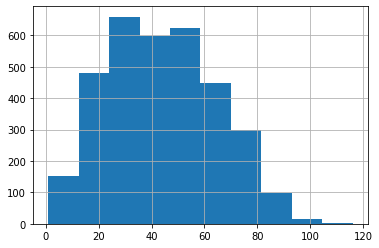

In [14]:
train['image_id'].value_counts().hist()

이미지의 출처별로 개수 알아보기

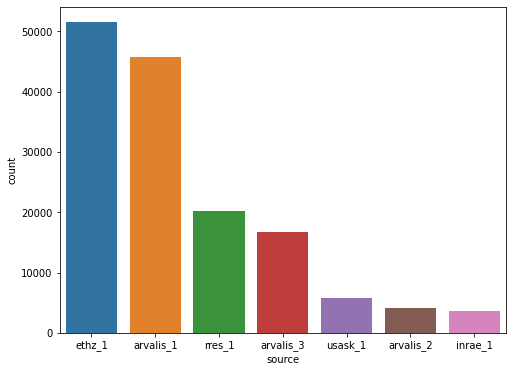

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.subplots(1,1, figsize=(8,6))
sns.countplot(train['source'], order=train['source'].value_counts().index)

* 여기서 source는 데이터를 제공한 연구소 이름을 말함
* ethz_1과 arvalis_1은 2 개의 주요 데이터 소스(총 데이터의 약 65 % 기여).
* 제공된 소스 측면에서 데이터 세트의 균형이 맞지 않음.

In [16]:
display(train.describe())

,width,height
count,147793.0,147793.0
mean,1024.0,1024.0
std,0.0,0.0
min,1024.0,1024.0
25%,1024.0,1024.0
50%,1024.0,1024.0
75%,1024.0,1024.0
max,1024.0,1024.0


결측값이 있는지 확인하기
* 결측값은 분석 오류를 발생시키거나 혹은 왜곡시킬 위험
* 따라서 데이터가 있으면 꼭 결측값이 있는지 확인해야 한다.
* isnull() 메소드는 관측치가 결측이면 True를 반환한다.
* 칼럼별 결측값 개수 구하기 : df.isnull().sum()

In [17]:
#결측값 측정 사용예시
df = pd.DataFrame({"a":[1,2,3,4],"b":[1,2,3,6],"c":[1, None, 3, 5]})
display(df)

total = df.isnull().sum()
print(total)

,a,b,c
0,1,1,1.0
1,2,2,NaN
2,3,3,3.0
3,4,6,5.0


a    0
b    0
c    1
dtype: int64


In [18]:
total = train.isnull().sum().sort_values(ascending = False)
percent = (train.isnull().sum()/train.isnull().count()*100).sort_values(ascending = False)
missing_train_data  = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
#print(len(missing_train_data))
print("결측값이 없다")
missing_train_data.head()

결측값이 없다


,Total,Percent
source,0,0.0
bbox,0,0.0
height,0,0.0
width,0,0.0
image_id,0,0.0


### Train 이미지 열어보기

./train/b6ab77fd7.jpg


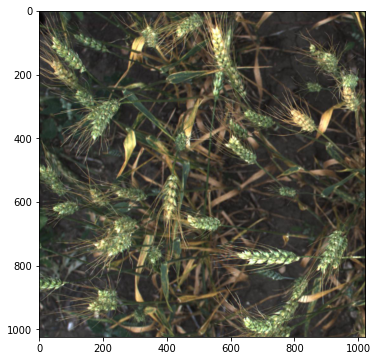

In [19]:
#첫번째 이미지 열어보기
image_path = os.path.join(TRAIN_DIR, 'b6ab77fd7.jpg')
print(image_path)
image = Image.open(image_path)
draw = ImageDraw.Draw(image)

plt.figure(figsize = (6,6))
plt.imshow(image)
plt.show()

In [20]:
train['image_id'] == 'b6ab77fd7'

0          True
1          True
2          True
3          True
4          True
          ...  
147788    False
147789    False
147790    False
147791    False
147792    False
Name: image_id, Length: 147793, dtype: bool

./train/b6ab77fd7.jpg


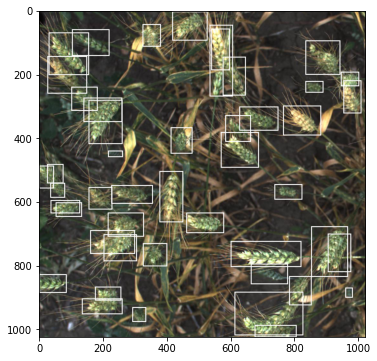

In [21]:
#이미지 위에 bbox 그려보기
image_path = os.path.join(TRAIN_DIR, 'b6ab77fd7.jpg')
print(image_path)
image = Image.open(image_path)
draw = ImageDraw.Draw(image)

bboxes = [literal_eval(box) for box in train[train['image_id'] == 'b6ab77fd7']['bbox']]
for bbox in bboxes:
    #print(bbox)
    draw.rectangle([bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]], width=3)


plt.figure(figsize = (6,6))
plt.imshow(image)
plt.show()

In [22]:
def display_images_large(images): 
    f, ax = plt.subplots(3,3, figsize=(20, 20))
    for i, image_id in enumerate(images):
        image_path = os.path.join(TRAIN_DIR, f'{image_id}.jpg')
        image = Image.open(image_path)        
        bboxes = [literal_eval(box) for box in train[train['image_id'] == image_id]['bbox']]
        # draw rectangles on image
        draw = ImageDraw.Draw(image)
        for bbox in bboxes:    
            draw.rectangle([bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]], width=3)
            
        ax[i//3, i%3].imshow(image) 
        ax[i//3, i%3].axis('off')
        source = train[train['image_id'] == image_id]['source'].values[0]
        ax[i//3, i%3].set_title(f"image_id: {image_id}\nSource: {source}")

    plt.show() 

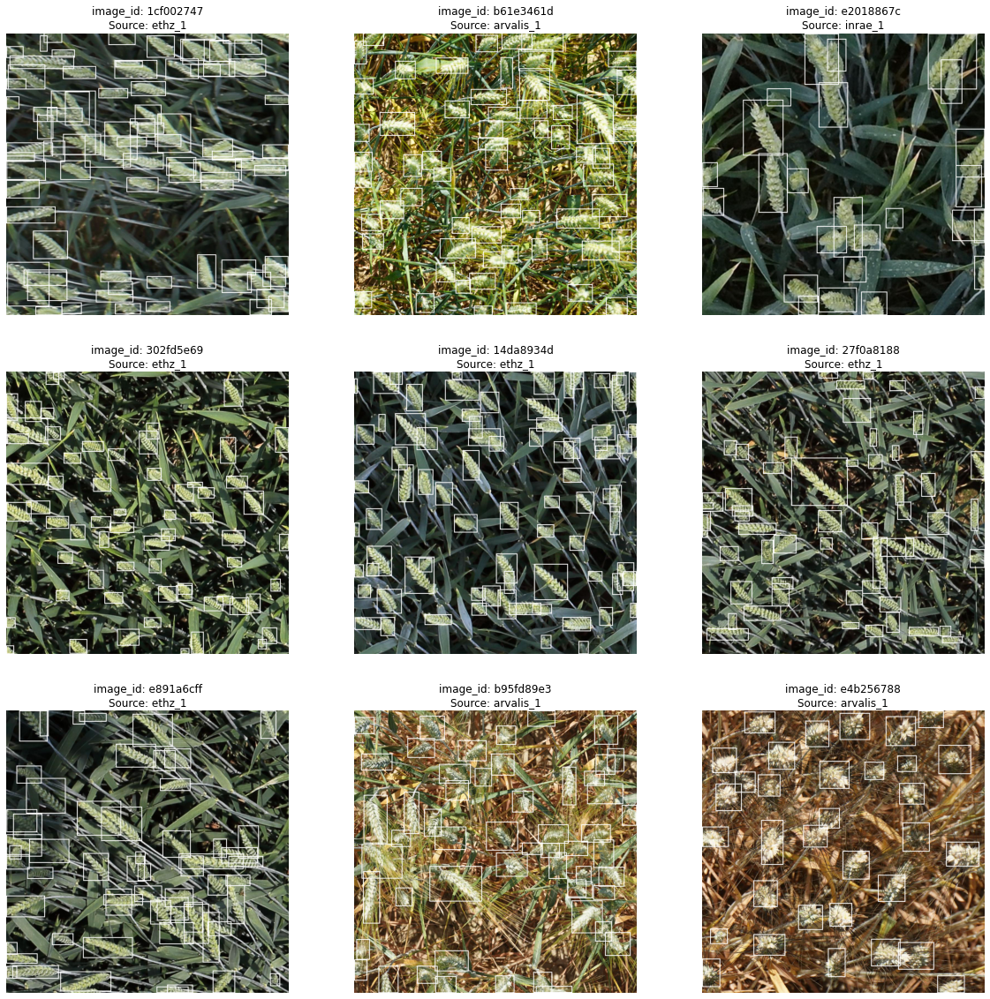

In [23]:
images = train.sample(n=9, random_state=42)['image_id'].values
display_images_large(images)

### Test 이미지 열어보기

In [24]:
def display_test_images(images): 
    f, ax = plt.subplots(4,3, figsize=(20, 20))
    for i, image_id in enumerate(images):
        image_path = os.path.join(TEST_DIR, f'{image_id}.jpg')
        image = Image.open(image_path)        
            
        ax[i//3, i%3].imshow(image) 
        ax[i//3, i%3].axis('off')
        ax[i//3, i%3].set_title(f"image_id: {image_id}")

    plt.show()

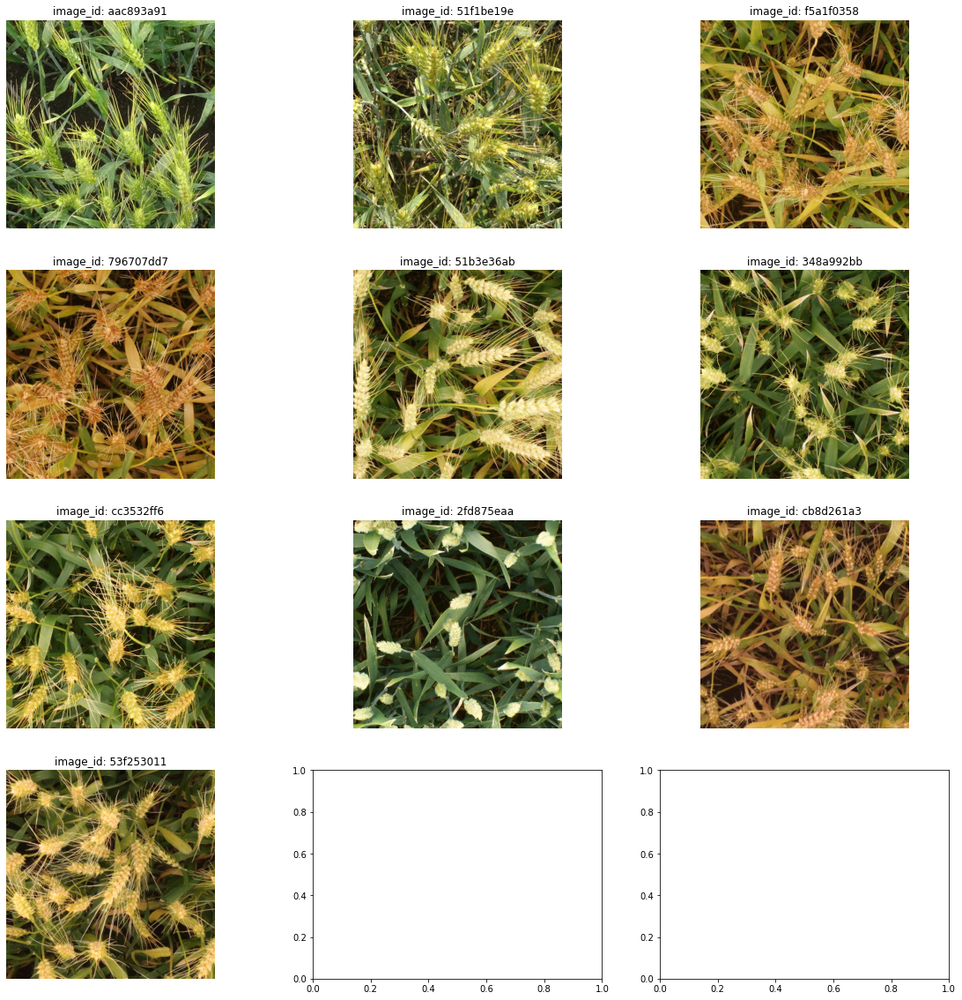

In [25]:
# since we need to predict bounding boxes for test images, hence below images do not have any bounding boxes
test_images = submission.image_id.values
display_test_images(test_images)

### 밀머리가 없는 이미지 열어보기

* 학습데이터에는 밀이 없는 사진도 있다. 이런 사진에서는 밀을 찾아내면 안된다. 
*  밀이 없는 사진이 몇개인지 찾고 그려보자

In [26]:
#number of unique images in the dataframe
len(train['image_id'].unique())

3373

In [27]:
#number of images in the training directory
len(os.listdir(TRAIN_DIR))

3422

In [28]:
#obtaining a list of all images which have no wheat heads in them
#append .jpg to image ids for easier handling
#train['image_id'] = train['image_id'].apply(lambda x: str(x) + '.jpg')
unique_imgs_wbox = list(train['image_id'].unique())
all_unique_imgs = os.listdir(TRAIN_DIR)
all_unique_imgs2 = []
for i in all_unique_imgs:
    i = i.split('.')[0]
    all_unique_imgs2.append(i)
no_wheat_imgs = [img_id for img_id in all_unique_imgs2 if img_id not in unique_imgs_wbox]
len(no_wheat_imgs)

49

In [29]:
def display_nowheat_images(images): 
    f, ax = plt.subplots(3,3, figsize=(20, 20))
    for i, image_id in enumerate(images):
        image_path = os.path.join(TRAIN_DIR, f'{image_id}.jpg')
        image = Image.open(image_path)        
            
        ax[i//3, i%3].imshow(image) 
        ax[i//3, i%3].axis('off')
        ax[i//3, i%3].set_title(f"image_id: {image_id}")

    plt.show()

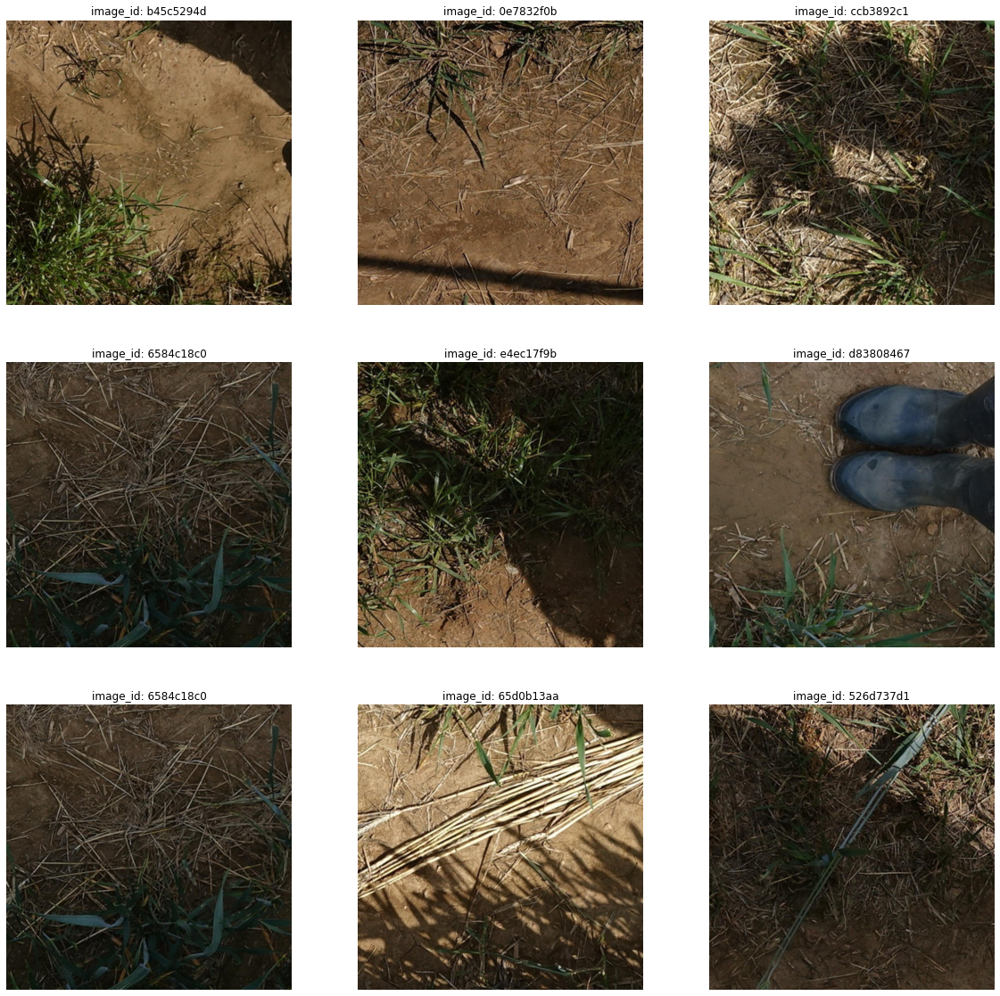

In [30]:
img_ids = np.random.choice(no_wheat_imgs, 9)
display_nowheat_images(img_ids)

### 각 연구소별 밀 사진

In [31]:
def show_images(images, num = 5):
    
    images_to_show = np.random.choice(images, num)

    for image_id in images_to_show:

        image_path = os.path.join(TRAIN_DIR, image_id + ".jpg")
        image = Image.open(image_path)

        # get all bboxes for given image in [xmin, ymin, width, height]
        bboxes = [literal_eval(box) for box in train[train['image_id'] == image_id]['bbox']]

        # visualize them
        draw = ImageDraw.Draw(image)
        for bbox in bboxes:    
            draw.rectangle([bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]], width=3)

        plt.figure(figsize = (5,5))
        plt.imshow(image)
        plt.show()

In [32]:
sources = train['source'].unique()

Showing images for usask_1:


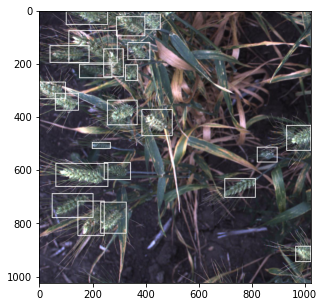

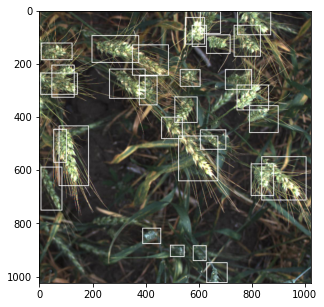

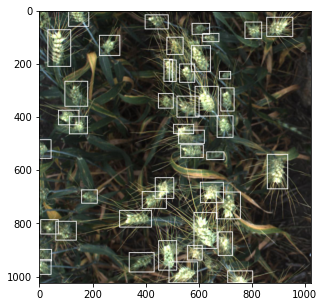

Showing images for arvalis_1:


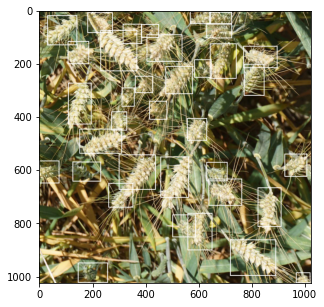

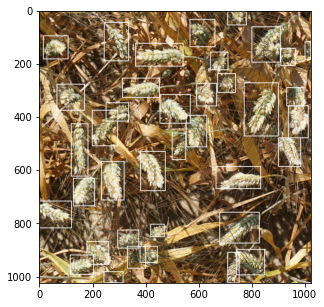

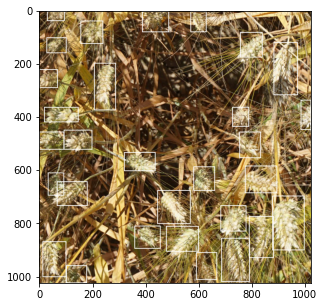

Showing images for inrae_1:


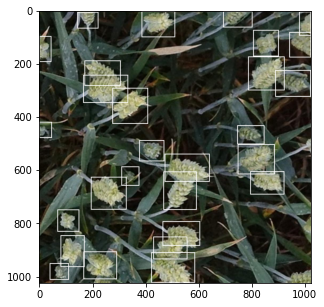

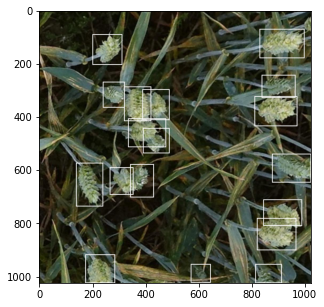

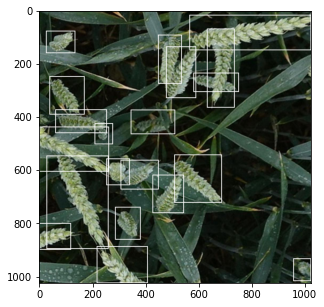

Showing images for ethz_1:


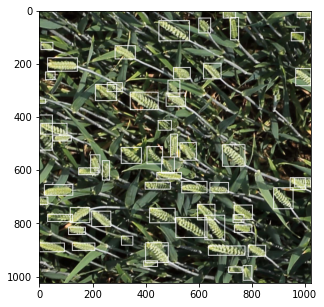

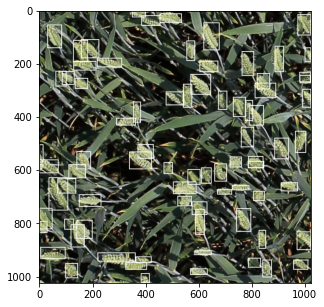

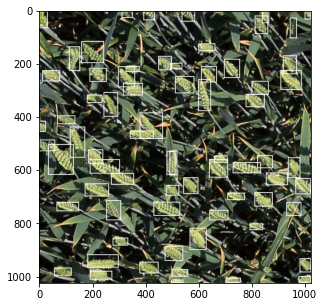

Showing images for arvalis_3:


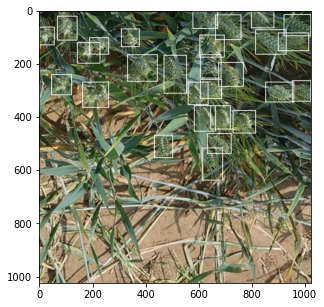

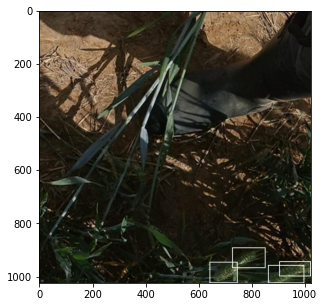

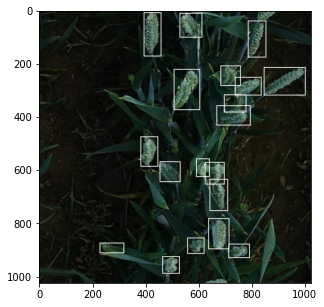

Showing images for rres_1:


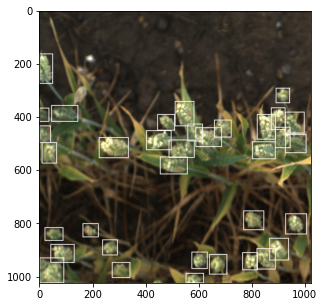

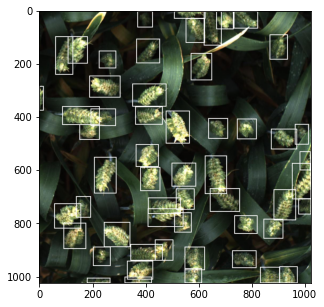

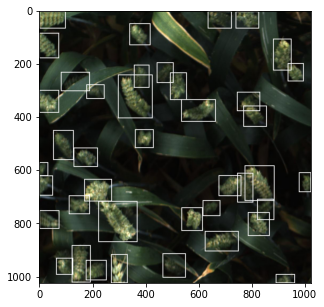

Showing images for arvalis_2:


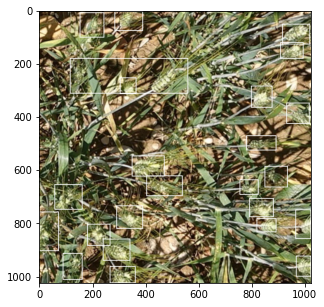

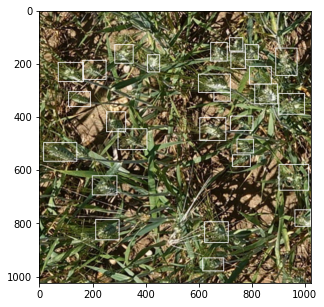

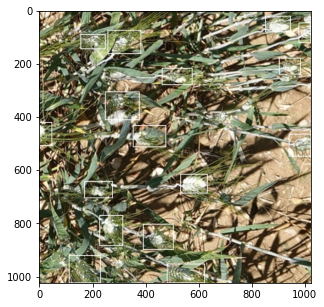

In [33]:
for source in sources:
    print(f"Showing images for {source}:")
    show_images(train[train['source'] == source]['image_id'].unique(), num = 3)

In [36]:
#!jupyter nbconvert --to pdf GWD-EDA-homework.ipynb